<a name="spa"></a>
# 2.1 - Spatial Analysis

___


## Project Workflow

1.0) Geological Setting and Mineral Disponibility 

1.1) Data Assessing and Data Cleaning

1.2) Exploratory Data Analysis & Geostats

**2.1) Spatial Analysis**

**2.2) Hydrograph Basins Delimitations**

**2.3) Correlation between basins and samples**

3.0) Conclusion
___

## Table Of Contents

- [2.1 Spatial Analysis](#spa)

    [Importing Libraries](#libs)

    [Spatial Validation: samples vs lithologies](#spatialval)

- [2.2 Hydrography Basin Separation](#hysep)

- [2.3 Correlation Between Basins and Samples](#coor)

<a name="libs"></a>
## Importing Libraries

In [7]:
import pandas as pd
import geopandas as gpd
import numpy as np
import folium
from shapely import geometry
import matplotlib.pyplot as plt

%matplotlib inline

In [8]:
df = pd.read_csv('OUTPUTS/CSV/pontos_data_cleaned.csv', sep = ';')

In [9]:
#transformando df em gdf
gdf = gpd.GeoDataFrame(df, geometry = gpd.points_from_xy(df['X'], df['Y']))

#setting the EPSG
gdf = gdf.set_crs("EPSG:31983")

#checking the EPSG
gdf.crs

<Projected CRS: EPSG:31983>
Name: SIRGAS 2000 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - 48°W to 42°W
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

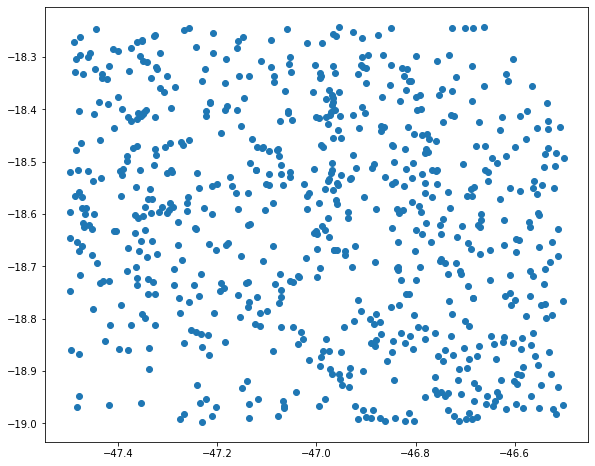

In [10]:
#converting
pwgs = gdf.to_crs(epsg = 4326)

#quick plot
pwgs.plot(figsize = (12,8))

In [11]:
#transforming to GMS columns
pwgs['lon'] = pwgs.geometry.x
pwgs['lat'] = pwgs.geometry.y


In [12]:
est = list(pwgs['Estação'])
x = list(pwgs['lon'])
y = list(pwgs['lat'])

loc = [-18.65, -47]
m = folium.Map(location = loc,
               zoom_start = 10,
              tiles = "Stamen Terrain")

fg = folium.FeatureGroup(name = 'Amostras Prospecção')


for est, long, lat in zip(est, x, y):
    fg.add_child(folium.Marker(
                                location=[lat,long],
                                popup="<b>Amostra: </b>"+est+ "<br>", 
                                icon = folium.Icon()
                                )
                )

m.add_child(fg)




_______

<a name="spatialval"></a>
# Spatial Validation: Sample x Lithology Group

- Now, let's take a look how each element distribution behave in different lithology group.

- Then, we'll plot them in basins.

In [13]:
# reading saved CSV file
df_anom = pd.read_csv('OUTPUTS/CSV/elements_anomaly_filtered.csv')

#transforming anomaly dataframe to geodataframe
gdf = gpd.GeoDataFrame(
    df_anom,
    geometry = gpd.points_from_xy(df_anom.x, df_anom.y)
)

#saving data with spatial information
gdf.to_csv('OUTPUTS/CSV/elements_anomaly_filtered_spatialData.csv', index = False)


#loading geologic shapefiles
lito = gpd.read_file('./shapefiles/Unidades_litoestratigráficas___1_100_000.shp')


In [14]:
gdf.head()

,station,x,y,element,value,anomaly,anom_type,geometry
0,EC-0122,281044,7961773,Al (%),0.884795,0.823883,2,POINT (281044.000 7961773.000)
1,BM0014,238782,7911968,Al (%),0.867467,0.823883,2,POINT (238782.000 7911968.000)
2,BM0028,236767,7925246,Al (%),0.894316,0.823883,2,POINT (236767.000 7925246.000)
3,BM-0174,332011,7908847,Al (%),0.972203,0.823883,2,POINT (332011.000 7908847.000)
4,EC-0124,321352,7910059,Al (%),0.940018,0.823883,2,POINT (321352.000 7910059.000)


In [15]:
#setting the CRS of the points 
gdf.set_crs('epsg:31983', inplace = True)

,station,x,y,element,value,anomaly,anom_type,geometry
0,EC-0122,281044,7961773,Al (%),0.884795,0.823883,2,POINT (281044.000 7961773.000)
1,BM0014,238782,7911968,Al (%),0.867467,0.823883,2,POINT (238782.000 7911968.000)
2,BM0028,236767,7925246,Al (%),0.894316,0.823883,2,POINT (236767.000 7925246.000)
3,BM-0174,332011,7908847,Al (%),0.972203,0.823883,2,POINT (332011.000 7908847.000)
4,EC-0124,321352,7910059,Al (%),0.940018,0.823883,2,POINT (321352.000 7910059.000)
...,...,...,...,...,...,...,...,...
467,SM-0083,339758,7955762,Zr (ppm),1.905796,1.799041,2,POINT (339758.000 7955762.000)
468,SM-0091,324828,7957056,Zr (ppm),1.801404,1.799041,2,POINT (324828.000 7957056.000)
469,LG-0028,317479,7901094,Zr (ppm),1.893207,1.799041,2,POINT (317479.000 7901094.000)
470,MR-0211,305520,7915678,Zr (ppm),1.848805,1.799041,2,POINT (305520.000 7915678.000)


In [16]:
#checking CRS information
gdf.crs

<Projected CRS: EPSG:31983>
Name: SIRGAS 2000 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - 48°W to 42°W
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [17]:
#transforming CRS from 31983 to 4326
gdf.to_crs(4326, inplace = True)

In [18]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [33]:
#filtering only 1st order anomaly from anomalies table
anomOne = gdf.loc[gdf['anom_type'] == 1]
print(f'In total, there are {len(anomOne)} samples classified as Anomaly Type 1.')

In total, there are 42 samples classified as Anomaly Type 1.


In [34]:
#filtering only 2nd order anomaly from anomalies table
anomTwo = gdf.loc[gdf['anom_type'] == 2]
print(f'In total, there are {len(anomTwo)} samples classified as Anomaly Type 2.')

In total, there are 430 samples classified as Anomaly Type 2.


### Static View

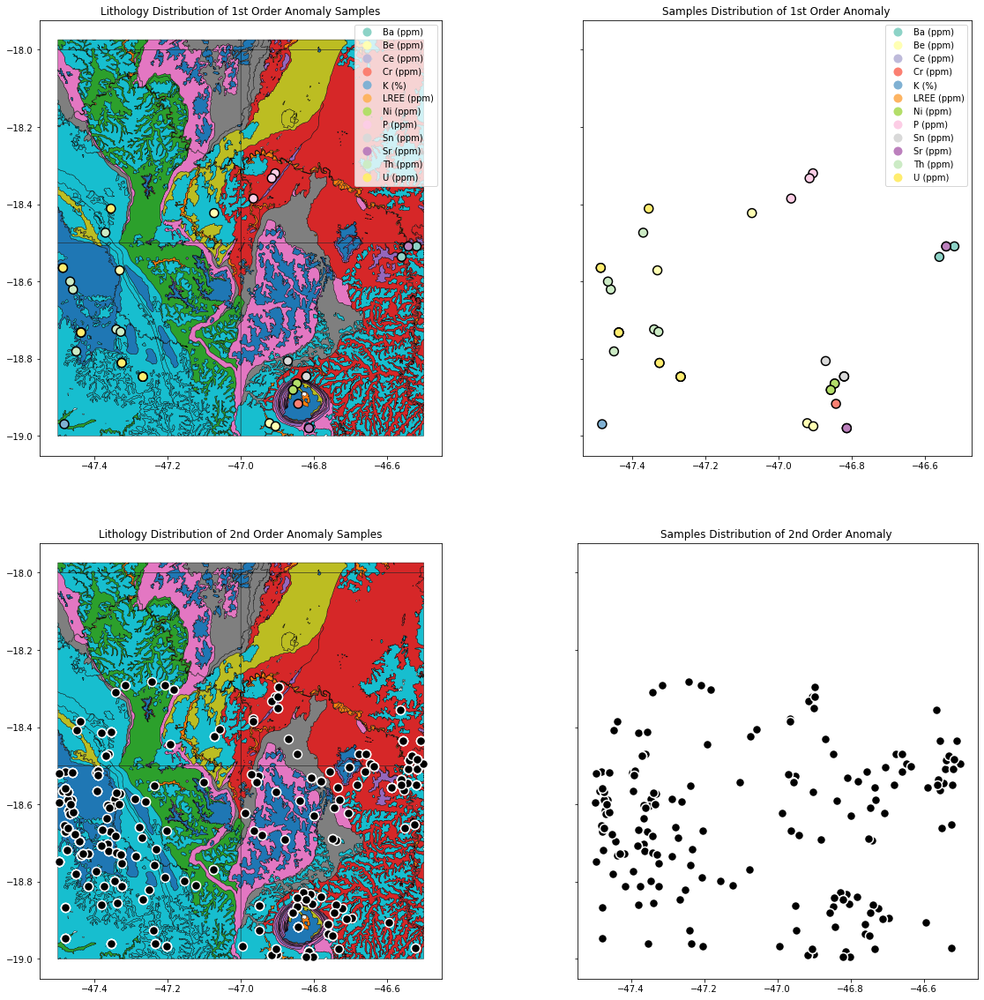

In [36]:
fig, axes = plt.subplots(nrows = 2,
                         ncols=2,
                         sharey=True,
                         figsize = (20,20)
                        )

# add geopandas plot to left subplot
lito.plot(ax=axes[0,0],
       column="NOME",
       edgecolor = 'black',
       linewidth = 0.4,
       figsize = (12,10)
              )
anomOne.plot(ax=axes[0,0],
             column = 'element',
             cmap = 'Set3',
             edgecolor = 'black',
             markersize= 100,
             linewidth = 1.5,
             legend = True)
axes[0,0].set_title('Lithology Distribution of 1st Order Anomaly Samples');

#add geopandas plot to the right suplot
lito.plot(ax=axes[1,0],
          column="NOME",
          edgecolor = 'black',
          linewidth = 0.4,
         )

anomTwo.plot(ax=axes[1,0],
             color = 'black',
             edgecolor = 'w',
             linewidth = 1.5,
             markersize= 100)

axes[1,0].set_title('Lithology Distribution of 2nd Order Anomaly Samples');

#add geopandas plot to the left bottom
anomOne.plot(ax=axes[0,1],
             column = 'element',
             cmap = 'Set3',
             edgecolor = 'black',
             markersize= 100,
             linewidth = 1.5,
             legend = True)
axes[0,1].set_title('Samples Distribution of 1st Order Anomaly ');


#add to the right bottom
anomTwo.plot(ax=axes[1,1],
             color = 'black',
             edgecolor = 'w',
             linewidth = 1.5,
             markersize= 100)
axes[1,1].set_title('Samples Distribution of 2nd Order Anomaly ');

fig.savefig('OUTPUTS/IMG/anomalies_distribuition.jpeg', bbox_inches = 'tight')

### Interactive Viz

In [54]:
import leafmap.leafmap as leafmap

shp= './shapefiles/Drenagens___1_1_000_000.shp'
m = leafmap.Map(center=([-18.65, -47]), zoom = 9)
m.add_gdf(anomOne, layer_name="Samples Anomaly Type 1")
m.add_gdf(lito, layer_name = 'Lithologies', fill_colors = ['red','yellow',
                                                           'blue', 'green',
                                                           'darkgreen','pink',
                                                           'purple','orange',
                                                           'cyan', 'grey',
                                                           'darkblue','lightgreen'])
m.add_shp(shp, layer_name = 'drenagem')
m

Map(center=[-18.65, -47], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_ou…

In [37]:
oneJoin = gpd.sjoin(anomOne, lito, how = "left", op="within")
oneJoin.head()

,station,x,y,element,value,anomaly,anom_type,geometry,index_right,ID_UNIDADE,...,EON_MAX,ERA_MIN,ERA_MAX,SISTEMA_MI,SISTEMA_MA,EPOCA_MIN,EPOCA_MAX,SIGLAS_HIS,SHAPE_AREA,SHAPE_LEN
36,SQ-0020A,339604,7952821,Ba (ppm),3.155032,3.049356,1,POINT (-46.51941 -18.50903),1116,723,...,Proterozóico,Neoproterozóico,Neoproterozóico,Ediacarano,Ediacarano,Pridoliano,Pridoliano,NP2ss,0.000773,0.336361
37,SQ-0021,337232,7952778,Ba (ppm),3.243038,3.049356,1,POINT (-46.54188 -18.50923),1116,723,...,Proterozóico,Neoproterozóico,Neoproterozóico,Ediacarano,Ediacarano,Pridoliano,Pridoliano,NP2ss,0.000773,0.336361
38,SQ-0024,335287,7949753,Ba (ppm),3.073352,3.049356,1,POINT (-46.56054 -18.53641),966,723,...,Proterozóico,Neoproterozóico,Neoproterozóico,Ediacarano,Ediacarano,Pridoliano,Pridoliano,NP2ss,0.054810,18.927352
41,EC-0122,281044,7961773,Be (ppm),1.000000,0.966576,1,POINT (-47.07294 -18.42290),1041,1498,...,Fanerozóico,Cenozóico,Cenozóico,Neogeno,Neogeno,Superior,Superior,N3di,0.009870,1.085807
52,MR0046,253953,7945025,Be (ppm),1.012837,0.966576,1,POINT (-47.33132 -18.57118),731,5678,...,Proterozóico,Neoproterozóico,Neoproterozóico,Toniano,Toniano,Wenloquiano,Wenloquiano,None,0.007145,0.866590


In [38]:
oneJoin.columns

Index(['station', 'x', 'y', 'element', 'value', 'anomaly', 'anom_type',
       'geometry', 'index_right', 'ID_UNIDADE', 'SIGLA', 'HIERARQUIA', 'NOME',
       'AMBIENTE_T', 'SUB_AMBIEN', 'SIGLA_PAI', 'NOME_PAI', 'LEGENDA',
       'ESCALA', 'MAPA', 'LITOTIPOS', 'RANGE', 'IDADE_MIN', 'IDADE_MAX',
       'EON_MIN', 'EON_MAX', 'ERA_MIN', 'ERA_MAX', 'SISTEMA_MI', 'SISTEMA_MA',
       'EPOCA_MIN', 'EPOCA_MAX', 'SIGLAS_HIS', 'SHAPE_AREA', 'SHAPE_LEN'],
      dtype='object')

In [39]:
oneJoinFilter = oneJoin.filter(items = ['station', 'x', 'y',
                                        'element', 'value',
                                        'anomaly', 'anom_type',
                                        'geometry', 'SIGLA',
                                        'NOME', 'LITOTIPOS',
                                        'LEGENDA']
                              )
oneJoinFilter.to_csv('OUTPUTS/CSV/relation_sample_firstOrder_lithology.csv', index = False)

In [40]:
oneJoinFilter.head()

,station,x,y,element,value,anomaly,anom_type,geometry,SIGLA,NOME,LITOTIPOS,LEGENDA
36,SQ-0020A,339604,7952821,Ba (ppm),3.155032,3.049356,1,POINT (-46.51941 -18.50903),NP3sd,Formação Serra da Saudade,"Arenito, Metapelito, Metargilito, Metassiltito",Sequência de sedimentos terrígenos intercalado...
37,SQ-0021,337232,7952778,Ba (ppm),3.243038,3.049356,1,POINT (-46.54188 -18.50923),NP3sd,Formação Serra da Saudade,"Arenito, Metapelito, Metargilito, Metassiltito",Sequência de sedimentos terrígenos intercalado...
38,SQ-0024,335287,7949753,Ba (ppm),3.073352,3.049356,1,POINT (-46.56054 -18.53641),NP3sd,Formação Serra da Saudade,"Arenito, Metapelito, Metargilito, Metassiltito",Sequência de sedimentos terrígenos intercalado...
41,EC-0122,281044,7961773,Be (ppm),1.000000,0.966576,1,POINT (-47.07294 -18.42290),Q1di,Unidade Depósitos detríticos indiferenciados,"Areia, Argila, Siltito","Cobertura detrítica inconsolidada, formada por..."
52,MR0046,253953,7945025,Be (ppm),1.012837,0.966576,1,POINT (-47.33132 -18.57118),NP1amx,"Unidade Araxá, micaxisto",Mica xisto,(Granada)-mica xistos com níveis de quartzitos...


In [41]:
totalLitho = oneJoinFilter.LITOTIPOS.nunique()
totalFm = oneJoinFilter.NOME.nunique()
print(f'In total, there are 1st order anomalies samples in {totalLitho} lithologies.\nThey belong to a total of {totalFm} Units/Formations')


In total, there are 1st order anomalies samples in 10 lithologies.
They belong to a total of 12 Units/Formations


In [42]:
print('As Unidades e Formações são as seguintes: \n')
for i in oneJoinFilter.NOME.unique():
    print(i)

As Unidades e Formações são as seguintes: 

Formação Serra da Saudade
Unidade Depósitos detríticos indiferenciados
Unidade Araxá, micaxisto
Depósitos aluvionares
Complexo Monte Carmelo
Litofácies Hidrelétrica da Batalha, filito
Suíte intrusiva Serra Negra
Coberturas eluvionares detrito-lateríticas
Formação Marília
Formação Serra de Santa Helena
Membro Serra da Anta
Unidade Abadia dos Dourados, filito


In [43]:
print('As litologias com maior concentração de anomalias são: \n')
for i in oneJoinFilter.LITOTIPOS.unique():
    print(i)

As litologias com maior concentração de anomalias são: 

Arenito, Metapelito, Metargilito, Metassiltito
Areia, Argila, Siltito
Mica xisto
Areia, Areia arcoseana, Argila, Cascalho, Conglomerado polimítico, Silte
None
Filito, Quartzito
Piroxenito
Conglomerado oligomítico, Laterita
Arenito, Argilito arenoso
Arenito, Argilito, Calcário, Calcário calcítico, Calcário dolomítico, Folhelho, Marga, Metarenito, Metargilito, Metassiltito, Siltito
Filito, Filito grafítico, Quartzito, Quartzito ferruginoso


### Analysis: 

- Due to the fact that these samples are sediment-stream samples, we cannot confirm that there's a relation between the anomalous element concentration with the local lithology. That's why we need to use another approch. In this case, we'll use a MDE to delimitate all basins and try to spot tha main source of each anomaly.

<a name="hysep"></a>
## 2.2 Delimitating Hydrografic Basins 

- To accomplish this step, we're going to need QGIS' support. We'll follow this [tutorial](https://www.geosaber.com.br/post/2018-03-07-qgis3-delimitacao-bacias/) and then import all generated files to this notebook.

<a name="corr"></a>
## 2.3 Correlation between basins and samples

In [106]:
basins = gpd.read_file('shapefiles/fullBasins.geojson')
basins.head()

,fid,DN,geometry
0,1,6,"POLYGON ((-46.21403 -17.02597, -46.21403 -17.0..."
1,2,3,"POLYGON ((-46.22875 -16.99986, -46.22875 -17.0..."
2,3,331,"POLYGON ((-46.21347 -17.02708, -46.21347 -17.0..."
3,4,332,"POLYGON ((-46.21292 -17.02708, -46.21292 -17.0..."
4,5,332,"POLYGON ((-46.21431 -17.02681, -46.21431 -17.0..."


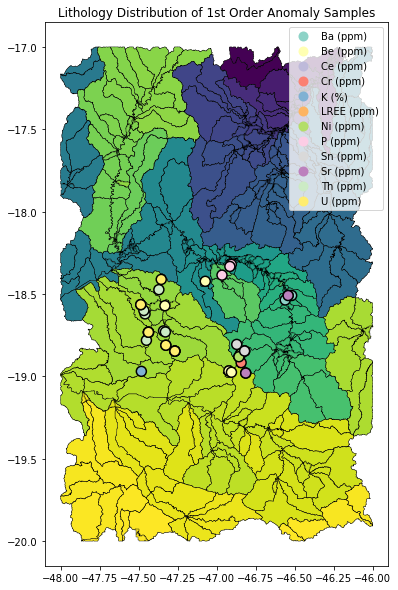

In [107]:
# add geopandas plot to left subplot
ax = basins.plot(
        column = 'DN',
       edgecolor = 'black',
       linewidth = 0.4,
       figsize = (12,10)
              )
anomOne.plot(ax=ax,
             column = 'element',
             cmap = 'Set3',
             edgecolor = 'black',
             markersize= 100,
             linewidth = 1.5,
             legend = True)
plt.title('Lithology Distribution of 1st Order Anomaly Samples');

In [108]:
anomOne.head()

,station,x,y,element,value,anomaly,anom_type,geometry
36,SQ-0020A,339604,7952821,Ba (ppm),3.155032,3.049356,1,POINT (-46.51941 -18.50903)
37,SQ-0021,337232,7952778,Ba (ppm),3.243038,3.049356,1,POINT (-46.54188 -18.50923)
38,SQ-0024,335287,7949753,Ba (ppm),3.073352,3.049356,1,POINT (-46.56054 -18.53641)
41,EC-0122,281044,7961773,Be (ppm),1.000000,0.966576,1,POINT (-47.07294 -18.42290)
52,MR0046,253953,7945025,Be (ppm),1.012837,0.966576,1,POINT (-47.33132 -18.57118)


In [109]:
basinJoin = gpd.sjoin(
    left_df = basins,
    right_df = anomOne,
    how = "left",
    op="contains"
)

basinJoin

,fid,DN,geometry,index_right,station,x,y,element,value,anomaly,anom_type
0,1,6,"POLYGON ((-46.21403 -17.02597, -46.21403 -17.0...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,3,"POLYGON ((-46.22875 -16.99986, -46.22875 -17.0...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,331,"POLYGON ((-46.21347 -17.02708, -46.21347 -17.0...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,332,"POLYGON ((-46.21292 -17.02708, -46.21292 -17.0...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,332,"POLYGON ((-46.21431 -17.02681, -46.21431 -17.0...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1156,1157,828,"POLYGON ((-47.77181 -19.70042, -47.77181 -19.7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1157,1158,827,"POLYGON ((-47.62819 -19.66625, -47.62819 -19.6...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1158,1159,831,"POLYGON ((-47.43764 -19.76431, -47.43764 -19.7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1159,1160,832,"POLYGON ((-47.51903 -19.92708, -47.51903 -19.9...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [111]:
basinJoinElements = basinJoin[basinJoin['anom_type'] == 1]

In [151]:
elementList = list(basinJoinElements.element.unique())
elementList

['P (ppm)',
 'Be (ppm)',
 'Th (ppm)',
 'U (ppm)',
 'Ba (ppm)',
 'Sr (ppm)',
 'LREE (ppm)',
 'Ce (ppm)',
 'Sn (ppm)',
 'Ni (ppm)',
 'Cr (ppm)',
 'K (%)']

In [155]:
#function to loop all elements and create the charts

def elementViz(element):
    pointElement = anomOne[anomOne['element'] == element]
    elementBasin = basinJoinElements[basinJoinElements['element'] == element]
    
    fig, axes = plt.subplots(nrows = 2,
                         ncols=2,
                         figsize = (20,20)
                        )

    # add geopandas plot to left subplot (0,0)
    lito.plot(ax=axes[0,0],
           column="NOME",
           edgecolor = 'black',
           linewidth = 0.4,
           figsize = (12,10)
                  )
    anomOne.plot(ax=axes[0,0],
                 column = 'element',
                 cmap = 'Set3',
                 edgecolor = 'black',
                 markersize= 100,
                 linewidth = 1.5,
                 legend = True)
    axes[0,0].set_title('Lithology Distribution of 1st Order Anomaly Samples');

    #add geopandas plot to the (0,1)

    anomOne.plot(ax=axes[0,1],
                 column = 'element',
                 cmap = 'Set3',
                 edgecolor = 'black',
                 markersize= 100,
                 linewidth = 1.5,
                 legend = True)
    axes[0,1].set_title('Samples Distribution of 1st Order Anomaly ');


    #add geopandas plot to the left bottom (1,0)

    basins.plot(ax=axes[1,0],
              column="NOME",
              edgecolor = 'black',
              color = 'white',
              linewidth = 0.4,
             )

    anomOne.plot(ax=axes[1,0],
                 color = 'white',
                 edgecolor = 'black',
                 linewidth = 1.5,
                 markersize= 100)

    pointElement.plot(ax = axes[1,0],
                 column = 'value',
                 cmap = 'viridis',
                 legend = True
                )

    axes[1,0].set_title(f'1st Order Anomaly {element} Sample Distribuition');


    #add to the right bottom (1,1)


    basins.plot(ax=axes[1,1],
              column="NOME",
              edgecolor = 'black',
              color = 'white',
              linewidth = 0.4,
             )


    elementBasin.plot(ax = axes[1,1],
            column = 'value',
            cmap = 'viridis',
              legend = True)


    axes[1,1].set_title(f'Basins with High Anomaly of {element}')


    fig.savefig(f'OUTPUTS/IMG/{element[0:2]}_anomalies_distribuition.jpeg', bbox_inches = 'tight')
    

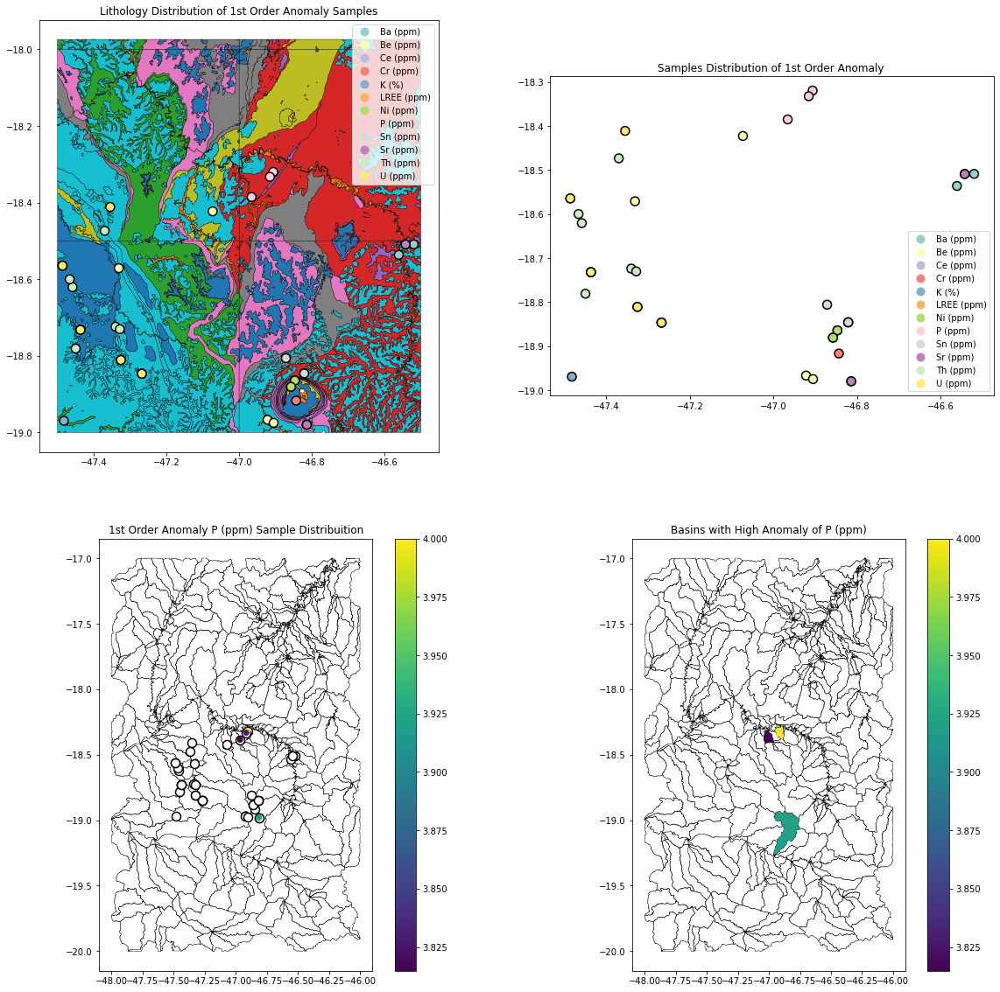

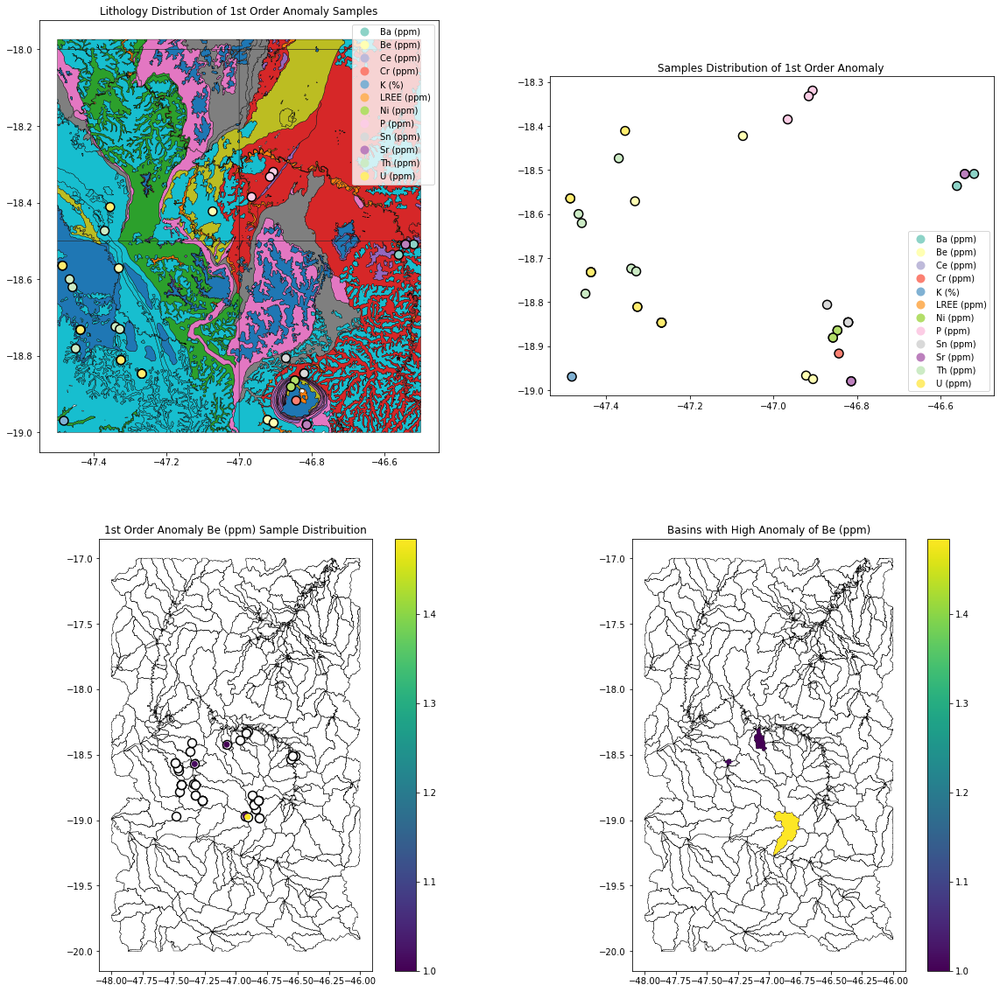

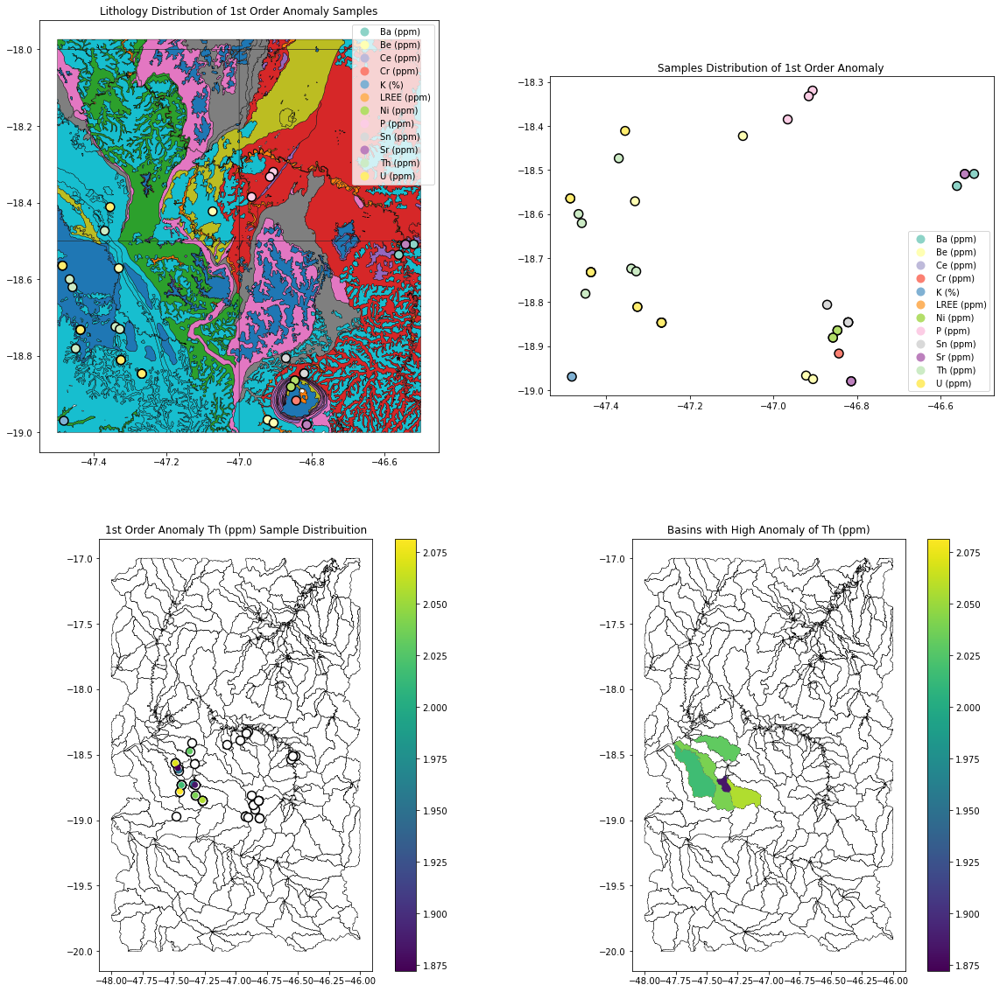

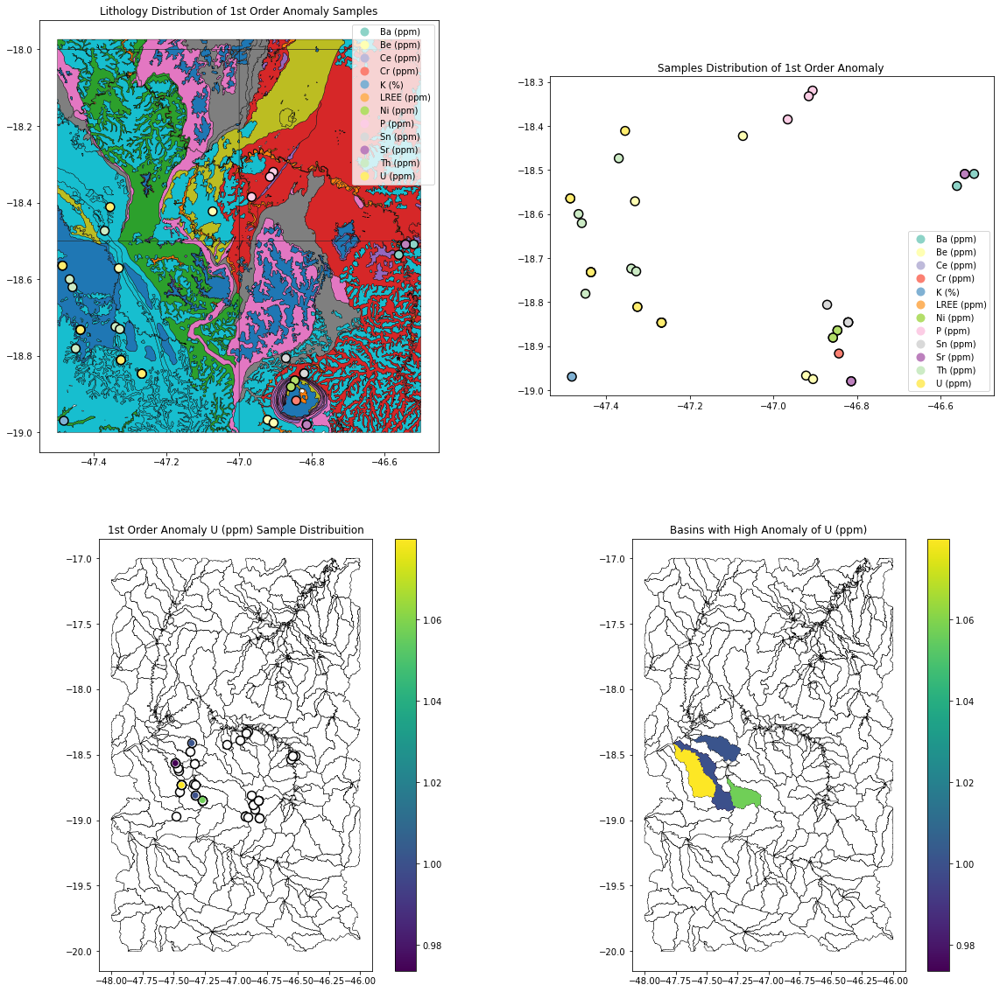

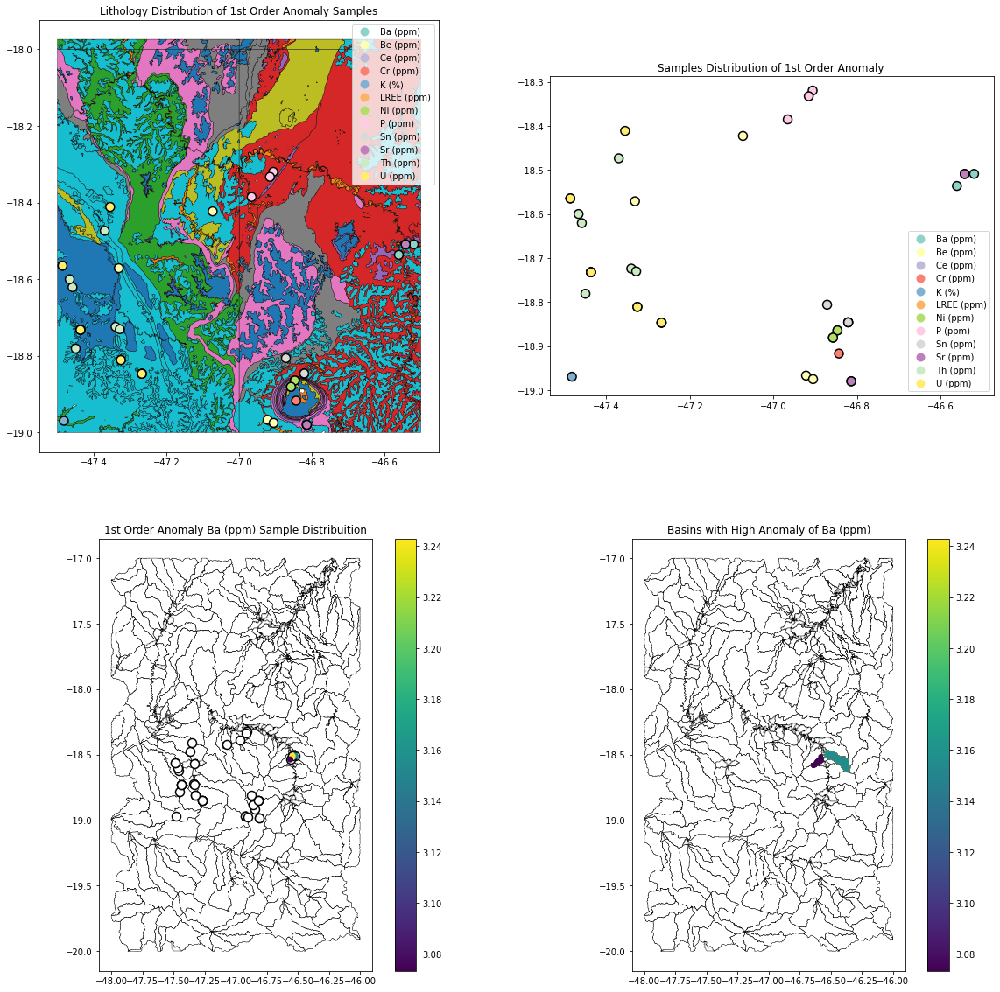

...

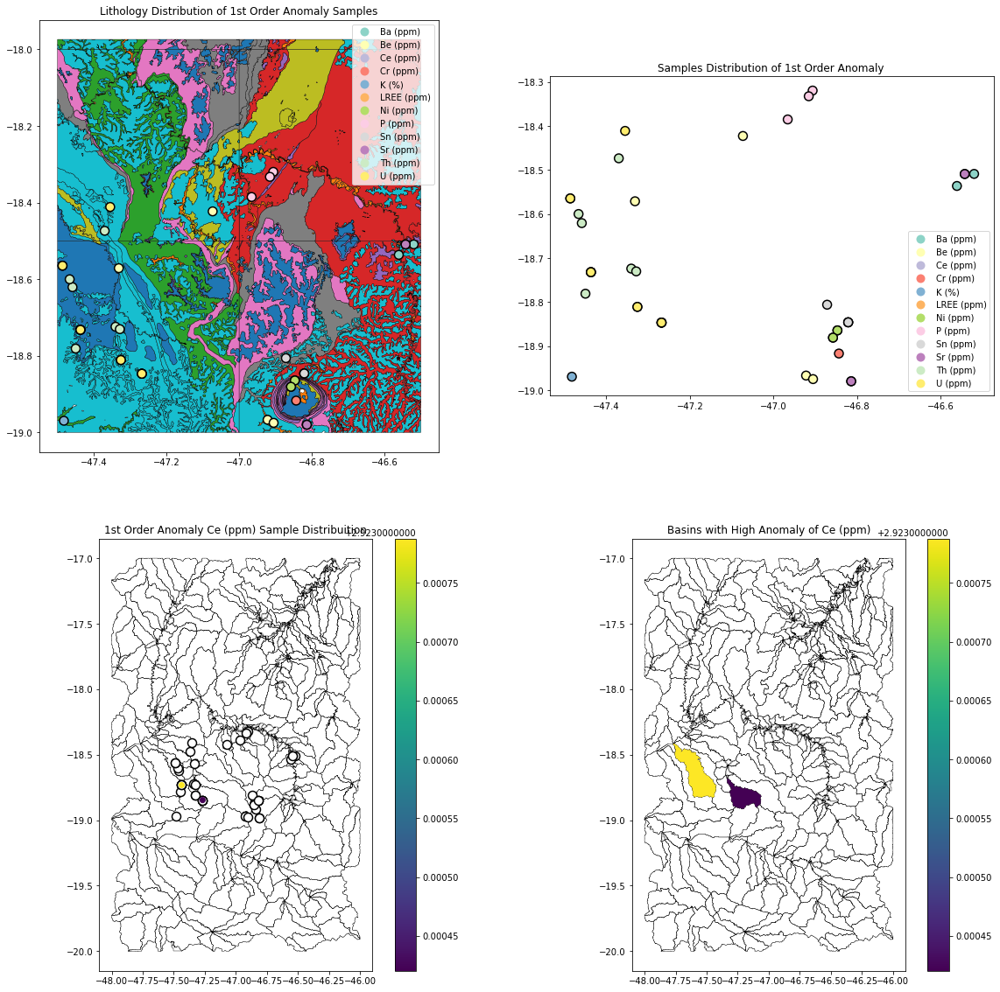

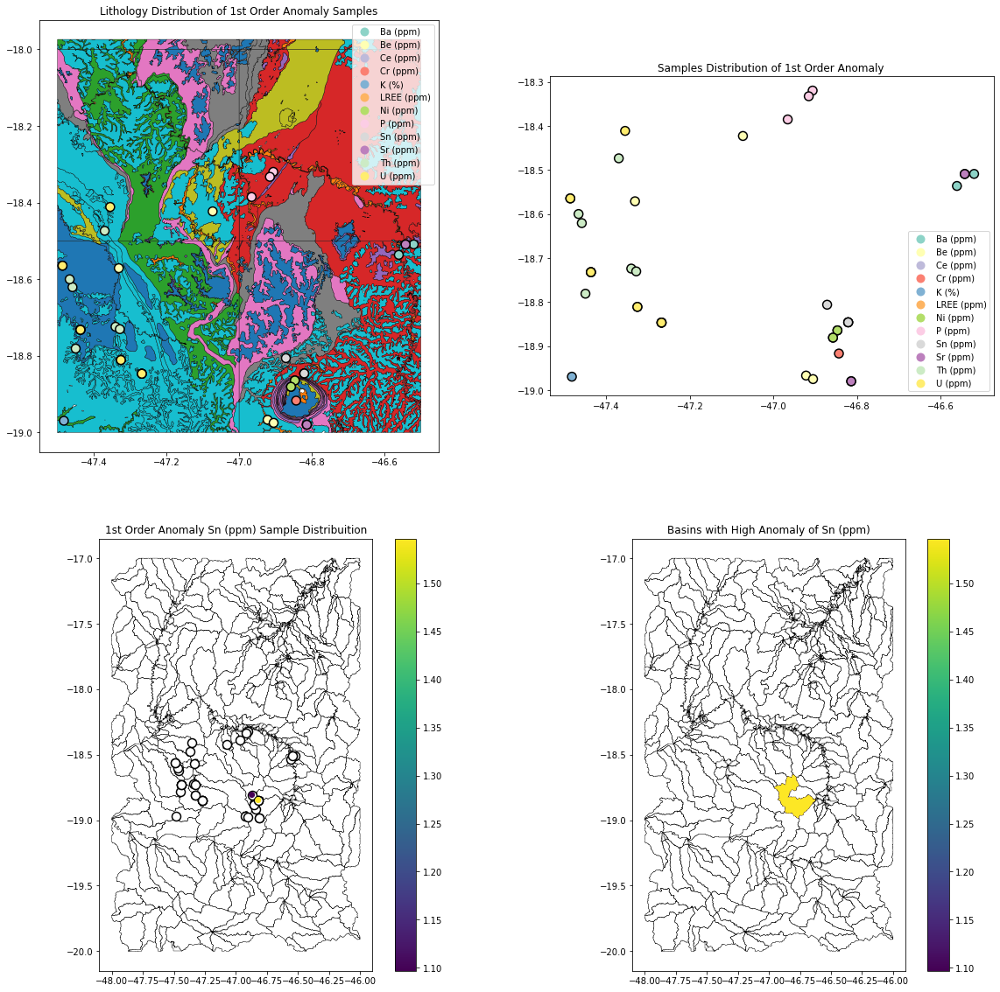

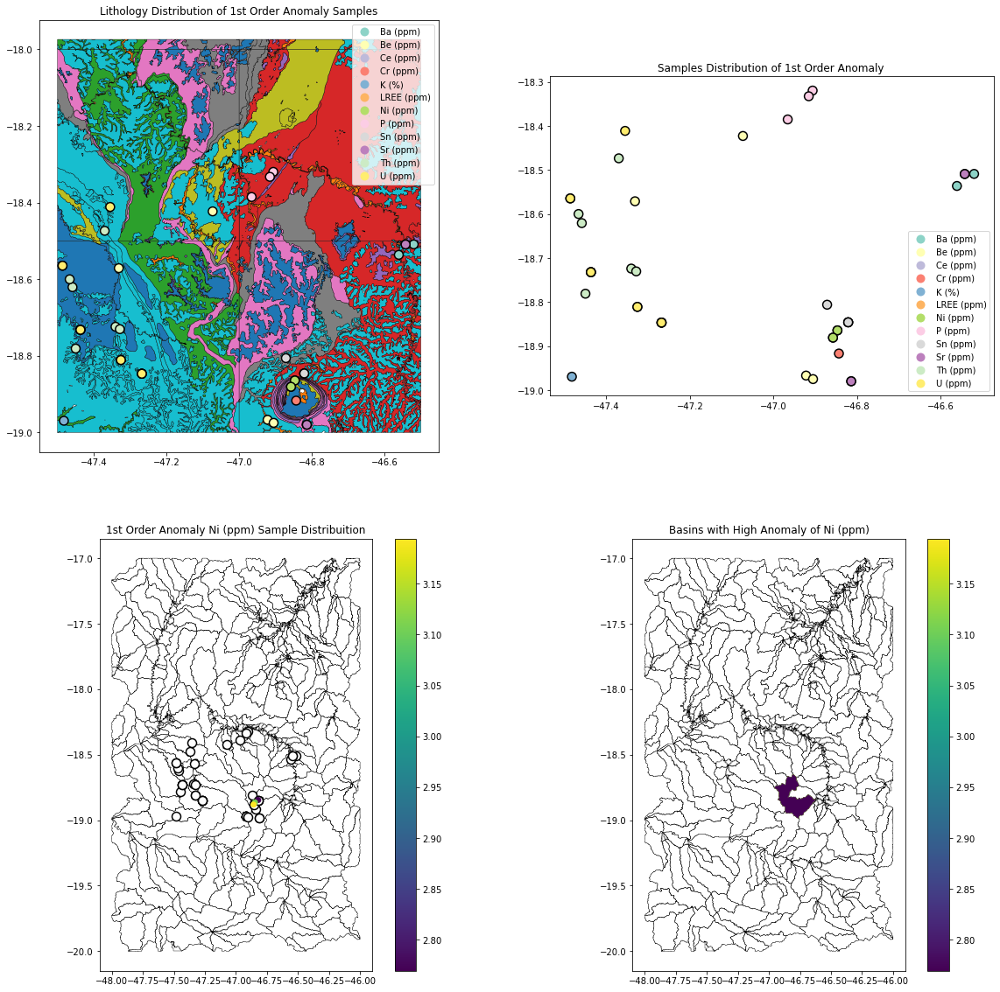

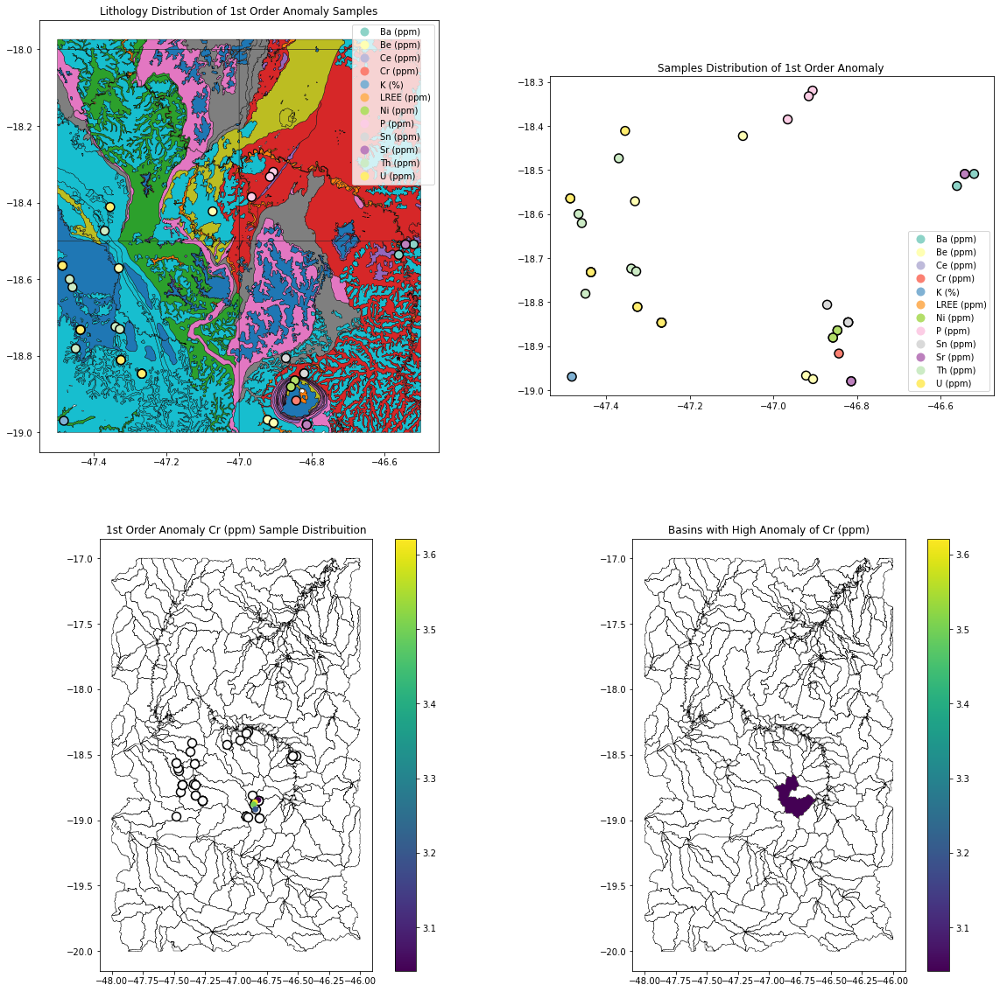

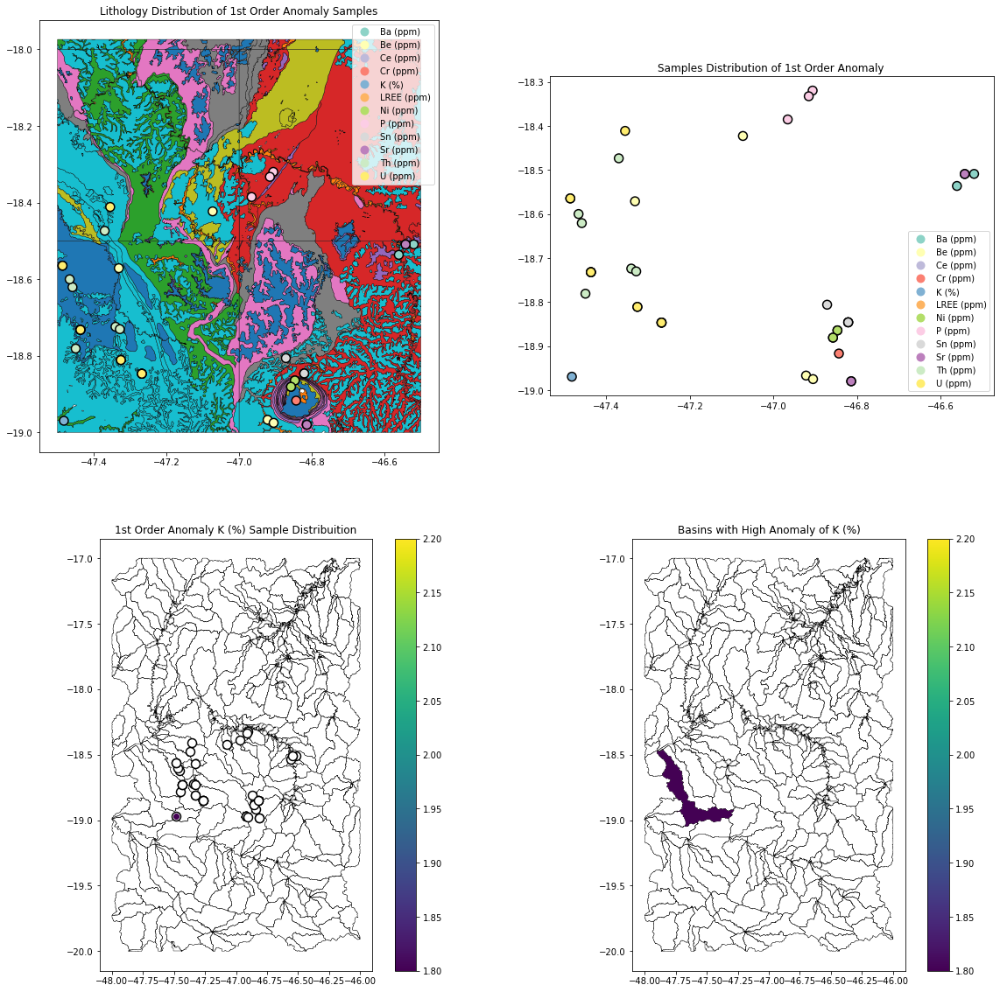

In [156]:
for i in elementList:
    elementViz(i)

In [129]:
pointTh = anomOne[anomOne['element'] == 'Th (ppm)']
Th = basinJoinElements[basinJoinElements['element'] == 'Th (ppm)']
Th

,fid,DN,geometry,index_right,station,x,y,element,value,anomaly,anom_type
899,900,702,"POLYGON ((-47.50597 -18.34903, -47.50597 -18.3...",375.0,BM-0132,249709.0,7955769.0,Th (ppm),2.030600,1.849911,1.0
953,954,709,"POLYGON ((-47.34875 -18.65792, -47.34875 -18.6...",378.0,AC0011,253225.0,7928084.0,Th (ppm),1.963788,1.849911,1.0
953,954,709,"POLYGON ((-47.34875 -18.65792, -47.34875 -18.6...",405.0,ED0060A,254483.0,7927400.0,Th (ppm),1.883661,1.849911,1.0
966,967,721,"POLYGON ((-47.77014 -18.41625, -47.77014 -18.4...",383.0,BM0007,241739.0,7921617.0,Th (ppm),2.081707,1.849911,1.0
966,967,721,"POLYGON ((-47.77014 -18.41625, -47.77014 -18.4...",388.0,BM0030A,243046.0,7927051.0,Th (ppm),2.016616,1.849911,1.0
991,992,713,"POLYGON ((-47.33208 -18.67986, -47.33208 -18.6...",385.0,BM0021,261042.0,7914599.0,Th (ppm),2.056524,1.849911,1.0
992,993,722,"POLYGON ((-47.71764 -18.39042, -47.71764 -18.3...",399.0,BM0046,237579.0,7945520.0,Th (ppm),2.071882,1.849911,1.0
992,993,722,"POLYGON ((-47.71764 -18.39042, -47.71764 -18.3...",397.0,BM0043,239721.0,7941627.0,Th (ppm),1.872156,1.849911,1.0
992,993,722,"POLYGON ((-47.71764 -18.39042, -47.71764 -18.3...",395.0,BM0040A,240572.0,7939356.0,Th (ppm),1.951823,1.849911,1.0
992,993,722,"POLYGON ((-47.71764 -18.39042, -47.71764 -18.3...",381.0,BM0004,254903.0,7918476.0,Th (ppm),2.039414,1.849911,1.0


<AxesSubplot:>

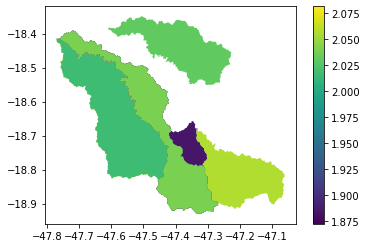

In [121]:
Th.plot(column = 'value',
        cmap = 'viridis',
          legend = True)

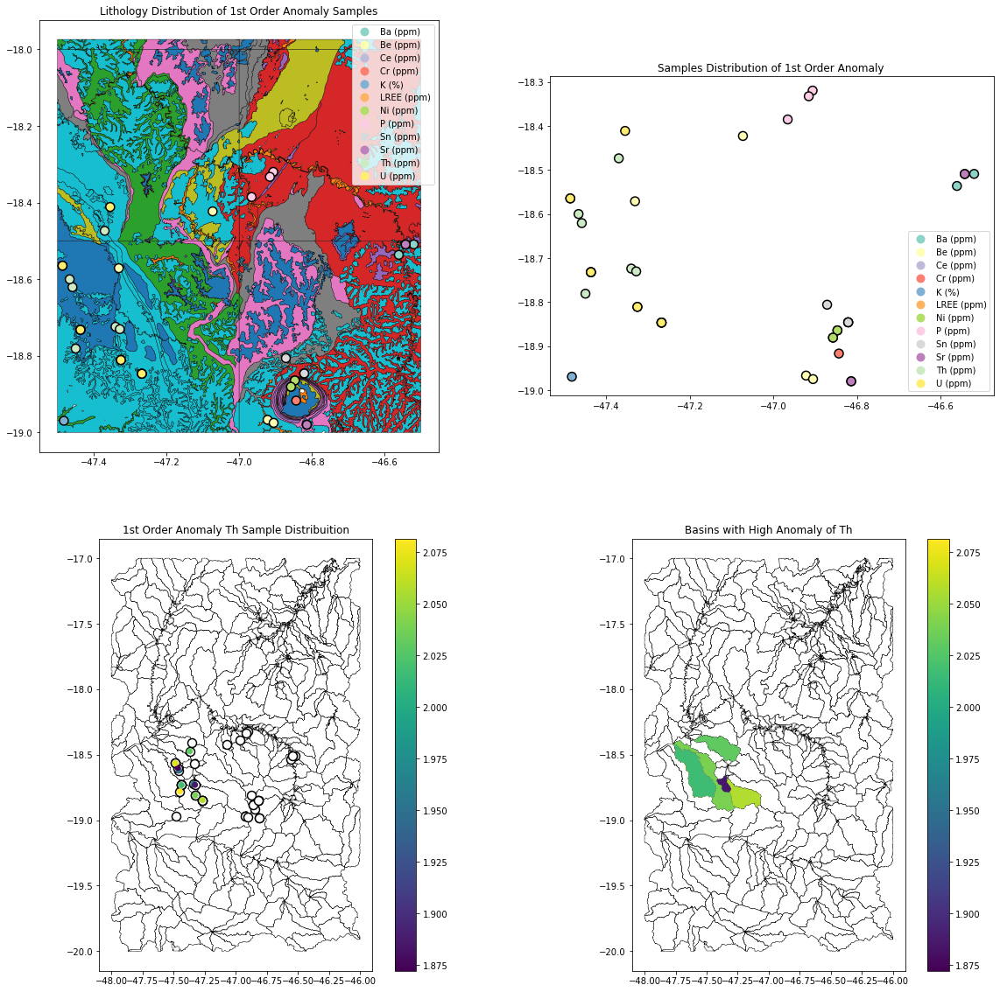

In [139]:
fig, axes = plt.subplots(nrows = 2,
                         ncols=2,
                         figsize = (20,20)
                        )

# add geopandas plot to left subplot (0,0)
lito.plot(ax=axes[0,0],
       column="NOME",
       edgecolor = 'black',
       linewidth = 0.4,
       figsize = (12,10)
              )
anomOne.plot(ax=axes[0,0],
             column = 'element',
             cmap = 'Set3',
             edgecolor = 'black',
             markersize= 100,
             linewidth = 1.5,
             legend = True)
axes[0,0].set_title('Lithology Distribution of 1st Order Anomaly Samples');

#add geopandas plot to the (0,1)

anomOne.plot(ax=axes[0,1],
             column = 'element',
             cmap = 'Set3',
             edgecolor = 'black',
             markersize= 100,
             linewidth = 1.5,
             legend = True)
axes[0,1].set_title('Samples Distribution of 1st Order Anomaly ');


#add geopandas plot to the left bottom (1,0)

basins.plot(ax=axes[1,0],
          column="NOME",
          edgecolor = 'black',
          color = 'white',
          linewidth = 0.4,
         )

anomOne.plot(ax=axes[1,0],
             color = 'white',
             edgecolor = 'black',
             linewidth = 1.5,
             markersize= 100)

pointTh.plot(ax = axes[1,0],
             column = 'value',
             cmap = 'viridis',
             legend = True
            )

axes[1,0].set_title('1st Order Anomaly Th Sample Distribuition');


#add to the right bottom (1,1)


basins.plot(ax=axes[1,1],
          column="NOME",
          edgecolor = 'black',
          color = 'white',
          linewidth = 0.4,
         )


Th.plot(ax = axes[1,1],
        column = 'value',
        cmap = 'viridis',
          legend = True)


axes[1,1].set_title('Basins with High Anomaly of Th')


fig.savefig('OUTPUTS/IMG/Th_anomalies_distribuition.jpeg', bbox_inches = 'tight')